(data:musdb18)=
# The MUSDB18 dataset

## Overview
The information in this sub-section is based on the [MUSB18 dataset page](https://sigsep.github.io/datasets/musdb.html). {cite}`musdb18,musdb18-hq` Here we have edited down the content to focus on the details relevant to this tutorial while keeping it concise. For more details about the datataset please consult the dataset page.

MUSDB18 is a dataset of 150 full length music tracks (~10h total duration) of varying genres. For each track it provides:
* The mixture 

And the following stems:
* Drums
* Bass
* Vocals
* Other

As its name suggests, the "other" stem contains all other sources in the mix that are not the drums, bass or vocals (labeled as 
"accompaniment" in the diagram below):

<img src=https://sigsep.github.io/assets/img/musheader.41c6bf29.png><br/>
Image source: [https://sigsep.github.io/](https://sigsep.github.io/)

All audio signals in the dataset are stereo and encoded at a sampling rate of 44.1 kHz. The mixture signal is identical to the sum of the stems.

The data in MUSDB18 is compiled from multiple sources: 
the [DSD100 dataset](dsd100.md), 
the [MedleyDB dataset](http://medleydb.weebly.com), 
the [Native Instruments stems pack](https://www.native-instruments.com/en/specials/stems-for-all/free-stems-tracks/),
and the [The Easton Ellises - heise stems remix competition](https://www.heise.de/ct/artikel/c-t-Remix-Wettbewerb-The-Easton-Ellises-2542427.html#englisch).

```{note}
MUSDB18 can be used for academic purposes only, with multiple of its tracks licensed under a Creative Commons Non-Commercial Share Alike license (BY-NC-SA).
```

The full dataset is divided into train and test folders with 100 and 50 songs respectively. As their names suggest, the former should be used for model training and 
the latter for model evaluation.

```{note}
You do not need to download the full MUSDB18 dataset to complete this tutorial. For simplicity, we'll be using short excerpts (clips) from this dataset which 
we will download via the `nussl` python library in the next step.  
```

The dataset was created by Zafar Rafii, Antoine Liutkus, Fabian-Robert Stöter, Stylianos Ioannis Mimilakis, and Rachel Bittner. When using the dataset in your work, please be sure to cite it as:

```
@misc{musdb18,
  author       = {Rafii, Zafar and
                  Liutkus, Antoine and
                  Fabian-Robert St{\"o}ter and
                  Mimilakis, Stylianos Ioannis and
                  Bittner, Rachel},
  title        = {The {MUSDB18} corpus for music separation},
  month        = dec,
  year         = 2017,
  doi          = {10.5281/zenodo.1117372},
  url          = {https://doi.org/10.5281/zenodo.1117372}
}
```


## Downloading and inspecting MUSDB18 clips

### Downloading MUSDB18 clips with nussl

We'll use `nussl`, the source separation library used in this tutorial, to download 7-second clips from MUSDB18. We'll get into `nussl` in greater detail in the next Chapter, but for we'll just use it to download and inspect the audio clips.

Let's start by installing `nussl`. We'll also install a package we wrote especially for this tutorial, `common`, that will help us visualize data easily.

In [1]:
%%capture
!pip install nussl
!pip install git+https://github.com/source-separation/tutorial

Now we're ready to import the tools we need for this section:

In [2]:
import nussl
from IPython.display import Audio
import IPython
from common import viz

The following cell will download 7-second clips for 143 of the 150 tracks in the dataset (the remaining 7 tracks do not have preview clips due to copyright, but are included in the full dataset):

In [3]:
# Run this command to download X 7-second clips from MUSDB18
musdb = nussl.datasets.MUSDB18(download=True)

Once the dataset has been downloaded to disk, subsequent instantiations of the `MUSDB18` class will skip the download step.

## Inspecting MUSDB18 clips

Let's get the just training data:

In [4]:
musdb_train = nussl.datasets.MUSDB18(subsets=['train'])

In [5]:
print(musdb_train.items)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]


We see there are 94 tracks in the train set. Let's explore the first item:

In [6]:
idx = 0
item = musdb[idx]
item.keys()

dict_keys(['mix', 'sources', 'metadata'])

Each item is a dictionary containing the mix, sources (stems), and metadata. The metadata for this item includes a list of stem labels:

In [7]:
item['metadata']

{'labels': ['bass', 'drums', 'other', 'vocals']}

We can also get this list by print the keys of the `sources` dictoinary:

In [8]:
item['sources'].keys()

dict_keys(['drums', 'bass', 'other', 'vocals'])

Let's listen to the mix:

In [9]:
Audio(data=item['mix'].audio_data, rate=item['mix'].sample_rate)

Now let's listen to each stem:

In [10]:
for stem_label in item['sources'].keys():
    print(stem_label)
    audio_player = Audio(data=item['sources'][stem_label].audio_data, rate=item['sources'][stem_label].sample_rate)
    IPython.display.display(audio_player)

drums


bass


other


vocals


Now let's plot the audio data. We could do this via [matplotlib](https://matplotlib.org/) or [librosa](https://github.com/librosa/librosa), but to make life easy, for this tutorial we've create a `viz` module which provides a `show_sources` function which:
* Takes a dictionary of stems (sources) as input
* Plots the audio signal of each stems in a different color, all in one subplot
* Plots the stems as time-frequency masks (more on this later) in a second subplot
* Creates an audio player where you can play all the stems together or selectively mute/solo each stem:

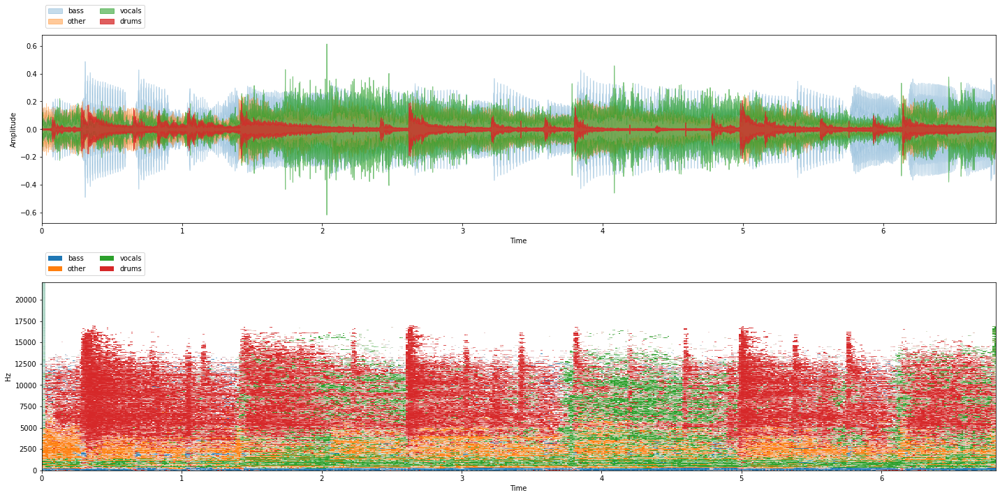


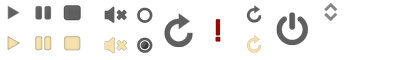
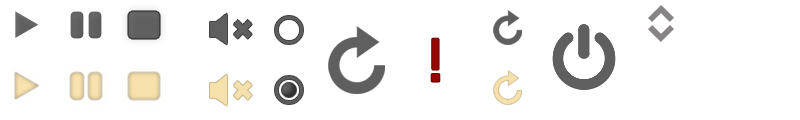
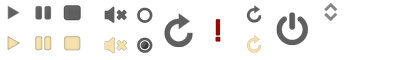

In [11]:
viz.show_sources(item['sources'])

### Exercise

Repeat the above steps for several items in the train set. What can you tell about the data from listening to it?

### Exercise
Repeat the above steps for several items from the test set, and answer:
* Do the train and test sets contain the same instruments?
* Is the train set representative of the musical data in the test set?
* Do you expect a model trained on the train set to generalize well to the test set?

Great, now that we've download and explored our data, we are ready to learn how to use Scaper to generate augmented training mixtures on the fly.